In [1]:
import pandas as pd
import numpy as np
import seaborn as sns 
import matplotlib.pyplot as plt
import glob
import os
from itertools import combinations
from scipy.stats import ttest_ind
import sys
sys.path.append('./colours/') # path to template designated colours
from colour_coding import template_colour,alt_template_colour

In [2]:
import warnings
warnings.filterwarnings('ignore') # make the notebook nicer

In [ ]:

def plot_distribution(df, title, save_path):
    """
    Plot each column of a dataframe in a distribution plot
    df: dataframe to plot
    title: title of plot
    save_path: path to save figure 
    """
 
        
    fig, ax = plt.subplots(figsize=(12,8))
    sns.despine(left=True)
    [sns.distplot(pd.Series(df[col]).dropna(), kde=False, hist=True, bins=int(24), 
                  kde_kws = {'shade': True, 'linewidth': 5}, color=template_colour[col[0:4]],label =col[0:4]) for col in list(df)]

    ax.set_ylabel("Counts", fontsize=20)
    ax.set_xlabel("Score REU", fontsize=20)
    #ax.set_yticklabels([])
    plt.yticks(fontsize=18)
    plt.xticks(fontsize=18)
    #plt.yticks(fontsize=18)
    #fig.legend(labels=[col[0:4]+protocol for col in list(df1)],loc="center right", borderaxespad=0.0, fontsize = 18 )   
    leg = plt.legend( loc = 'center right', bbox_to_anchor=(1.1, 0.5))
    plt.setp(ax.get_legend().get_texts(), fontsize='22')
    plt.title(title, fontsize = 22 )
    plt.savefig(save_path)
    return()



### create dataframe per score term

In [7]:
# path to first df
protocols = glob.glob('../output_data/*')

../output_data/Protocol1_data/score_term_distributions/dataframes/p_aa_pp.csv
../output_data/Protocol1_data/score_term_distributions/dataframes/fa_intra_sol_xover4.csv
../output_data/Protocol1_data/score_term_distributions/dataframes/fa_sol.csv
../output_data/Protocol1_data/score_term_distributions/dataframes/fa_dun.csv
../output_data/Protocol1_data/score_term_distributions/dataframes/yhh_planarity.csv
../output_data/Protocol1_data/score_term_distributions/dataframes/Unsatisfied_hbonds_core.csv
../output_data/Protocol1_data/score_term_distributions/dataframes/cart_bonded.csv
../output_data/Protocol1_data/score_term_distributions/dataframes/ref.csv
../output_data/Protocol1_data/score_term_distributions/dataframes/full_holes.csv
../output_data/Protocol1_data/score_term_distributions/dataframes/pack_stat.csv
../output_data/Protocol1_data/score_term_distributions/dataframes/buns_bb_heavy.csv
../output_data/Protocol1_data/score_term_distributions/dataframes/lk_ball_wtd.csv
../output_data/Pr

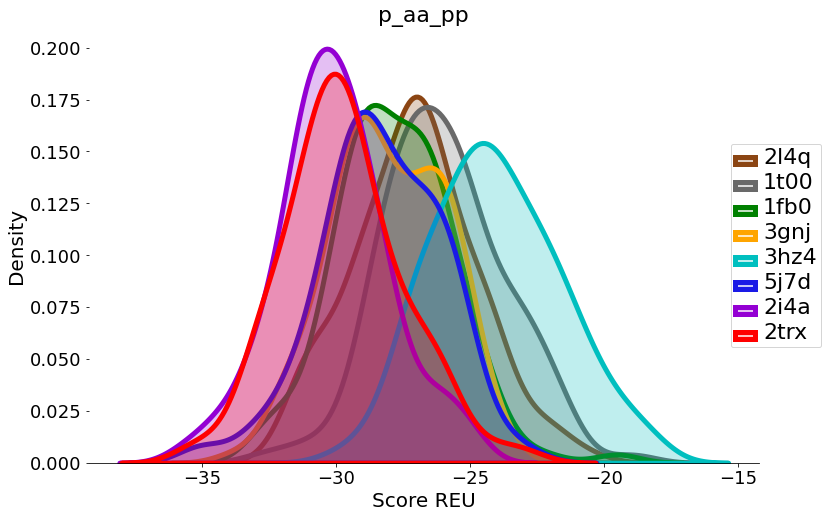

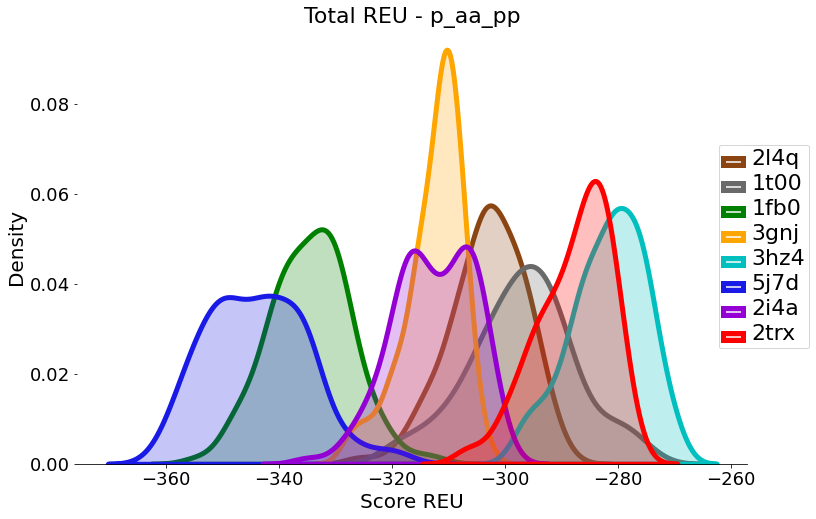

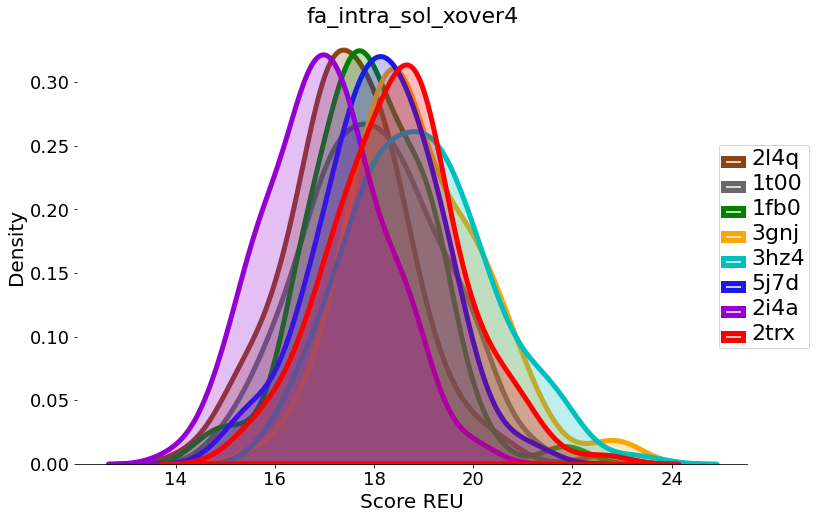

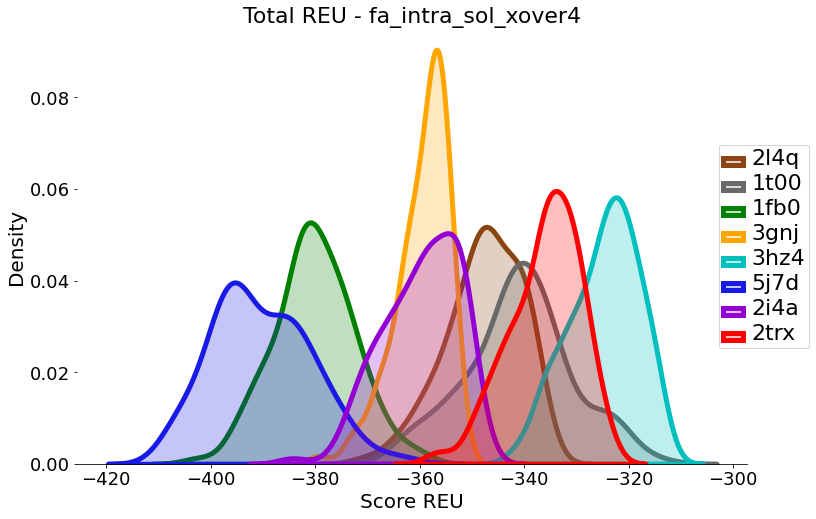

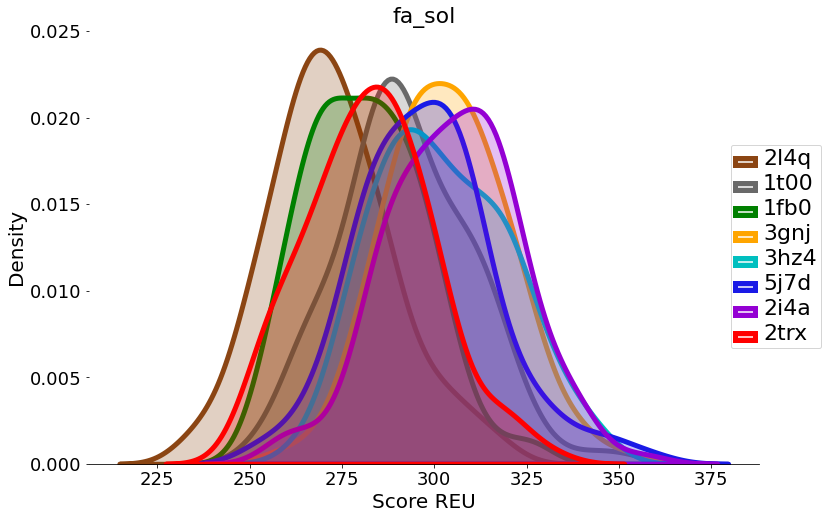

...

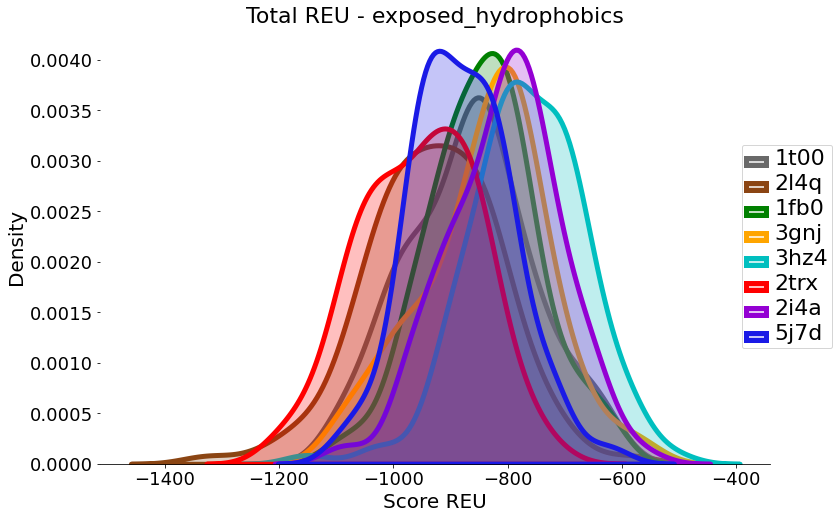

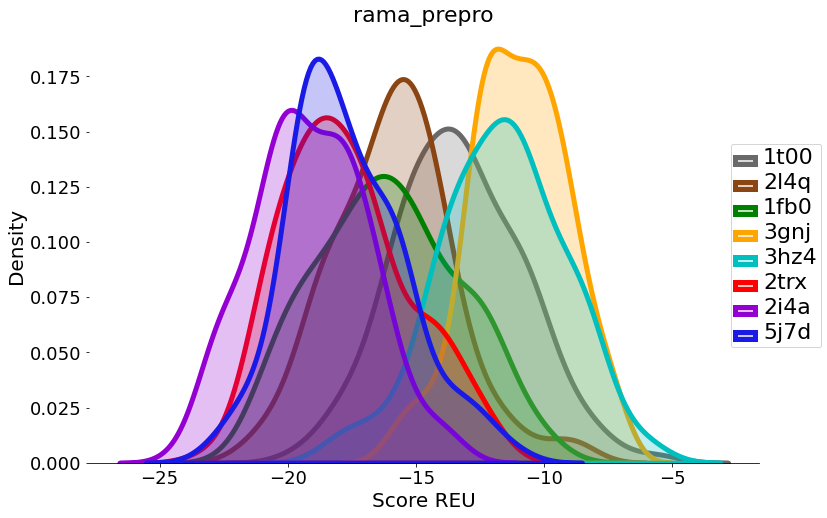

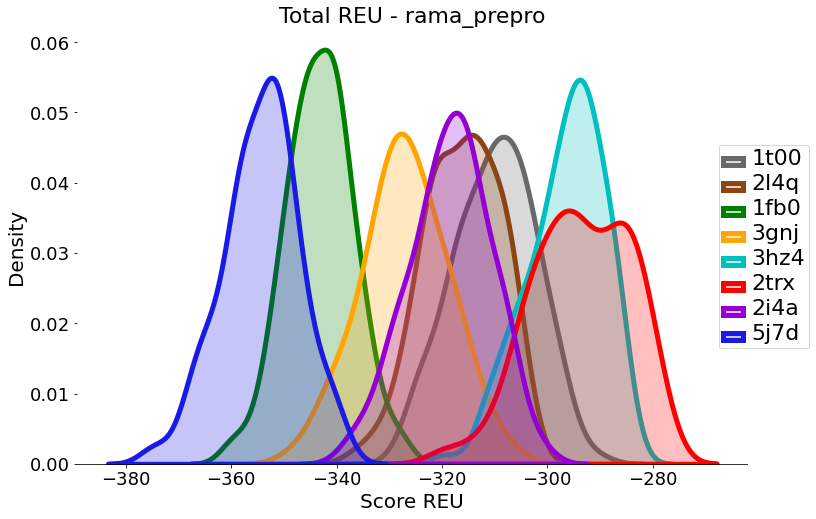

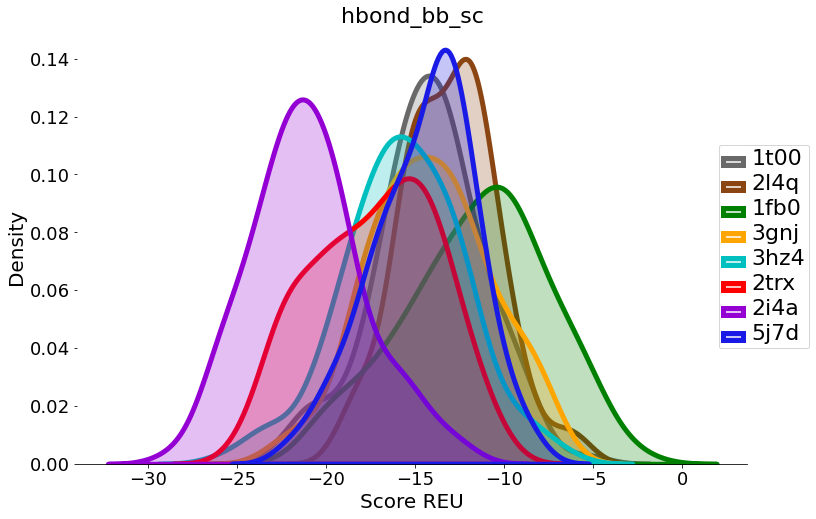

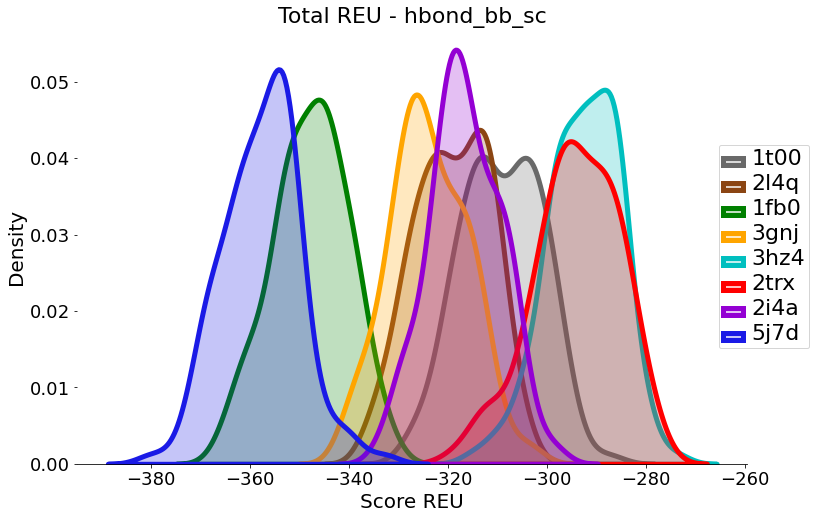

In [135]:

    
    
# loop over protocols
for protocol in protocols:
    # get scorefiles for protocol
    scorefiles = glob.glob(f'{protocol}/scorefiles/*sc')
    # create folder for score term distribution 
    path = f'{protocol}/score_term_distributions'
    if not os.path.exists(f'{path}/dataframes'):
        os.makedirs(path)
    # loop over scorefiles 
    for file in scorefiles:
        template_name = file.split('/')[-1].split('_')[1]
        template_df = pd.read_table(file)
        template_df = template_df.sort_values(by=['total_score'])
        score_terms = template_df.columns[1:]
        for score_term in score_terms: 
            score_term_path = (f'{path}/dataframes/{score_term}.csv')
            if os.path.exists(score_term_path): # if dataframe for score term already exists 
                score_term_df = pd.read_csv(score_term_path, header=0, index_col=False)
            else: # Create dataframe with column  
                score_term_df = pd.DataFrame()
            if not template_name in score_term_df.columns:
                score_term_df[template_name] = template_df[score_term]
            
            score_term_df.to_csv(score_term_path, index=False)
    
    
    # get dataframes to make distributions 
    dataframes =  glob.glob(f'{path}/dataframes/*csv')
    
    #make folders to contain plots
    if not os.path.exists(f'{path}/score_term_distribution_plots'):
        os.mkdir(f'{path}/score_term_distribution_plots')
        
    if not os.path.exists(f'{path}/total_sc-score_term_plots'):
        os.mkdir(f'{path}/total_sc-score_term_plots')
    
    total_sc_df = pd.read_csv(f'{path}/dataframes/total_score.csv',index_col=False, header=0)
    
    ignore_df = ['dslf_fa13','buns_sc_heavy','avg_scoreTerms', 'total_score', 'description']
    
    for file in dataframes: 
        
        score_term = os.path.splitext(os.path.basename(file))[0]
        # create distribution plot for each scoreterm
        if not any(map(file.__contains__, ['dslf_fa13','buns_sc_heavy', 'description'])):
            df = pd.read_csv(file ,index_col=False, header=0)
            plot_distribution(df, score_term, f'{path}/score_term_distribution_plots/{score_term}.png')
        
        # plot total_sc - score term 
        
        if not any(map(file.__contains__, ignore_df)):
            new_df = total_sc_df - df
            plot_distribution(new_df, f'Total REU - {score_term}', f'{path}/total_sc-score_term_plots/total_sc-{score_term}.png')
        

()

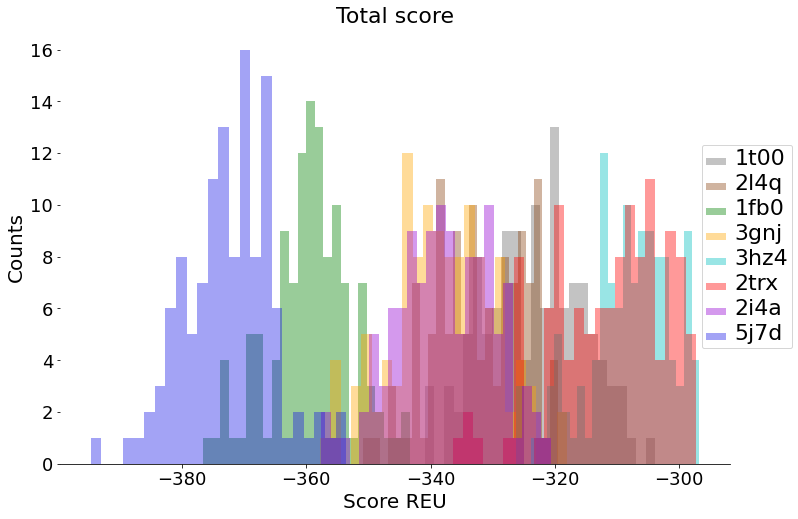

In [142]:
plot_distribution(total_sc_df,'Total score', '../total_sc_p2_counts.png')